In [547]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore")

from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.neighbors import KNeighborsRegressor
# from xgboost import XGBRegressor

In [606]:
df = pd.read_csv(r"D:\Downloads\listings.csv~\listings.csv")

## Display first 5 rows (transposed for better visibility)


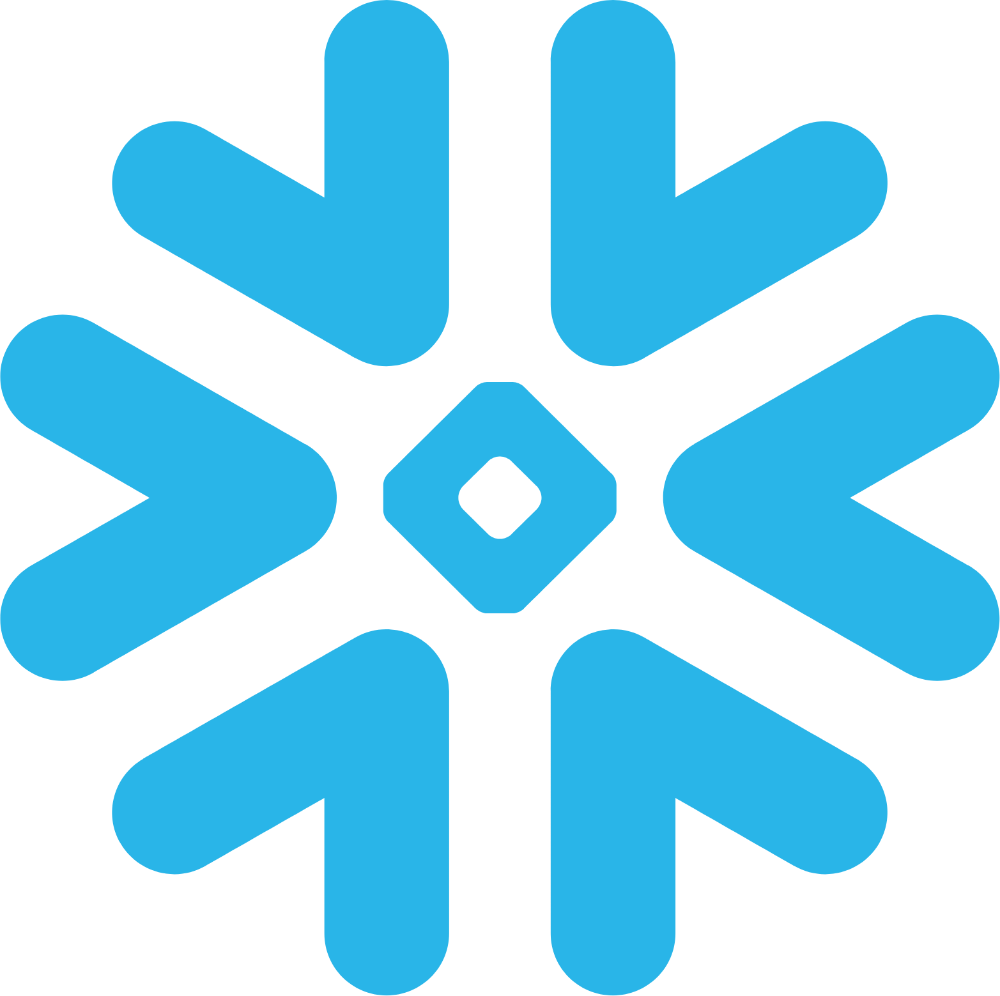

In [607]:
df.head().T

In [608]:
df.shape

(449, 79)

##  Basic info about the dataset

In [609]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 449 entries, 0 to 448
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            449 non-null    int64  
 1   listing_url                                   449 non-null    object 
 2   scrape_id                                     449 non-null    int64  
 3   last_scraped                                  449 non-null    object 
 4   source                                        449 non-null    object 
 5   name                                          449 non-null    object 
 6   description                                   439 non-null    object 
 7   neighborhood_overview                         203 non-null    object 
 8   picture_url                                   449 non-null    object 
 9   host_id                                       449 non-null    int

## Identifying Numerical and Categorical Columns¶


In [610]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)


d_type = df.dtypes
n_unique = df.nunique()
ratio_null = df.isnull().sum() / df.shape[0]

pd.DataFrame({'D_Type' : d_type  , "N_Unique" : n_unique , "Ratio_Null" : ratio_null} )

OverflowError: Maximum recursion level reached

In [611]:
df['property_type'].value_counts()

Entire rental unit                   214
Entire home                           74
Private room in home                  72
Private room in rental unit           28
Room in hotel                         12
Entire townhouse                      11
Entire condo                           7
Private room in bed and breakfast      5
Entire loft                            4
Private room in guest suite            4
Entire vacation home                   4
Entire guest suite                     3
Entire place                           2
Private room in townhouse              2
Entire guesthouse                      1
Private room in villa                  1
Private room in guesthouse             1
Room in aparthotel                     1
Entire cottage                         1
Entire serviced apartment              1
Private room in condo                  1
Name: property_type, dtype: int64

In [612]:
df = df.drop(columns = ['neighbourhood_group_cleansed' , 'calendar_updated' , 'license' , 'neighborhood_overview' , 'neighbourhood' , 'host_about'])

In [613]:
df.isnull().sum()

id                                                0
listing_url                                       0
scrape_id                                         0
last_scraped                                      0
source                                            0
name                                              0
description                                      10
picture_url                                       0
host_id                                           0
host_url                                          0
host_name                                         0
host_since                                        0
host_location                                   105
host_response_time                               28
host_response_rate                               28
host_acceptance_rate                              6
host_is_superhost                                 5
host_thumbnail_url                                0
host_picture_url                                  0
host_neighbo

In [614]:
df.duplicated().sum()

0

In [615]:
df['host_location'].value_counts()

Albany, NY                 245
New York, NY                28
United States               12
Colonie, NY                  6
Latham, NY                   6
Voorheesville, NY            6
Jackson Township, NJ         5
Saratoga Springs, NY         5
Murrieta, CA                 5
Gloversville, NY             3
Glenville, NY                3
Tampa, FL                    2
New Hartford, NY             2
San Juan, Puerto Rico        2
Providence, RI               2
Washington, DC               1
Loudonville, NY              1
New York, United States      1
Northampton, PA              1
Schenectady, NY              1
Fort Walton Beach, FL        1
Valley Stream, NY            1
Glenmont, NY                 1
Woodbury, NY                 1
Delmar, NY                   1
Stamford, NY                 1
Fayetteville, NC             1
Name: host_location, dtype: int64

## handel missing values and replace not mining text 

In [616]:
df['description'] = df['description'].fillna('No description')


In [617]:
df['host_location'] = df['host_location'].replace({
    'New York, United States': 'new york, ny',
    'United States': 'unknown',
})


In [618]:
threshold = 3 
value_counts = df['host_location'].value_counts()
mask = value_counts[value_counts <= threshold  ].index
df['host_location'] = df['host_location'].replace(mask , 'Others')

In [619]:
df['host_location'].value_counts()

Albany, NY              245
New York, NY             28
Others                   26
unknown                  12
Latham, NY                6
Voorheesville, NY         6
Colonie, NY               6
Saratoga Springs, NY      5
Murrieta, CA              5
Jackson Township, NJ      5
Name: host_location, dtype: int64

In [620]:
df['host_location'].isnull().sum()

105

In [621]:
df['host_location'] = df['host_location'].fillna('Others')

In [622]:
df['host_response_time'].value_counts()

within an hour        308
within a few hours     60
within a day           47
a few days or more      6
Name: host_response_time, dtype: int64

In [623]:
most_common = df['host_response_time'].mode()[0]
df['host_response_time'] = df['host_response_time'].fillna(most_common)

In [624]:
df['host_acceptance_rate'].value_counts()

100%    91
99%     70
97%     61
98%     47
93%     16
78%     16
50%     14
90%     12
0%      11
89%     10
13%      8
95%      7
60%      7
96%      6
88%      6
91%      5
77%      5
67%      5
23%      5
55%      4
81%      4
80%      4
86%      3
66%      2
85%      2
79%      2
74%      2
58%      2
84%      2
94%      2
75%      2
71%      1
40%      1
42%      1
73%      1
83%      1
92%      1
70%      1
47%      1
33%      1
36%      1
Name: host_acceptance_rate, dtype: int64

In [625]:
df['host_acceptance_rate'] = df['host_acceptance_rate'].str.replace('%' , '').astype(float) / 100

In [626]:
most_common = df['host_acceptance_rate'].mode()[0]
df['host_acceptance_rate'] = df['host_acceptance_rate'].fillna(most_common)

In [627]:
df['host_response_rate'].value_counts()

100%    354
97%      26
90%      19
80%       6
0%        5
67%       3
92%       1
98%       1
83%       1
91%       1
94%       1
50%       1
99%       1
38%       1
Name: host_response_rate, dtype: int64

In [628]:
df['host_response_rate'] = df['host_response_rate'].str.replace('%' , '').astype(float) / 100
most_common = df['host_response_rate'].mode()[0]
df['host_response_rate'] = df['host_response_rate'].fillna(most_common)

In [629]:
print(df['host_is_superhost'].value_counts())
df['host_is_superhost'] = df['host_is_superhost'].fillna(method = 'ffill')

t    245
f    199
Name: host_is_superhost, dtype: int64


In [630]:
df['host_neighbourhood'].value_counts()

Pine Hills                                    101
Mansion Area                                   42
Delaware Avenue                                30
Center Square & Hudson/Park                    27
Park South                                     20
Melrose                                        18
Washington Park                                14
Pastures                                       13
Central Avenue                                 12
Capitol Hill                                   11
Downtown                                        9
New Scotland                                    8
Arbor Hill                                      7
Highland Lakes                                  6
Southeast Raleigh                               6
West Hill                                       6
Ten Broeck Triangle                             6
Northwest Philadelphia                          5
Manning Boulevard                               4
Buckingham Lake                                 4


In [631]:
threshold = 3 
value_counts = df['host_neighbourhood'].value_counts()
mask = value_counts[value_counts <= threshold  ].index
df['host_neighbourhood'] = df['host_neighbourhood'].replace(mask , 'Others')

In [632]:
df['host_neighbourhood'] = df['host_neighbourhood'].fillna(method = 'ffill')

In [633]:
df['host_listings_count'].value_counts()

1       98
2       59
3       44
9       36
4       22
24      22
19      18
6       18
17      18
15      18
5       17
7       15
8       14
14      14
12      12
10      11
1214     6
594      5
11       2
Name: host_listings_count, dtype: int64

In [634]:
lis = ['beds' , 'bedrooms' , 'bathrooms' , 'has_availability' , 'review_scores_value' , 'review_scores_location' , 'review_scores_communication' 
       , 'review_scores_checkin' ,  'review_scores_cleanliness' , 'review_scores_accuracy' , 'review_scores_rating'  , 'host_neighbourhood']
for col in lis :
    mode_fill = df[col].mode()[0]
    df[col] = df[col].fillna(mode_fill)

In [635]:
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

In [636]:
mean_price = df['price'].mean()
df['price'] = df['price'].fillna(mean_price)

## handel date time Columns 

In [637]:
lis = ['first_review' , 'last_review']
for col in lis :
    mode_fill = df[col].mode()[0]
    df[col] = df[col].fillna(mode_fill)

In [638]:
df['first_review'] = pd.to_datetime(df['first_review'])
df['last_review'] = pd.to_datetime(df['last_review'])

In [639]:
df['first_review_year'] = df['first_review'].dt.year
df['first_review_month'] = df['first_review'].dt.month
df['first_review_day'] = df['first_review'].dt.day

df['last_review_year'] = df['last_review'].dt.year
df['last_review_month'] = df['last_review'].dt.month
df['last_review_day'] = df['last_review'].dt.day

In [640]:
df['estimated_revenue_l365d'] = df['estimated_revenue_l365d'].fillna(method = 'ffill')

In [641]:
df['reviews_per_month'] = df['reviews_per_month'].fillna(method = 'ffill')

In [642]:
df.isna().sum()

id                                              0
listing_url                                     0
scrape_id                                       0
last_scraped                                    0
source                                          0
name                                            0
description                                     0
picture_url                                     0
host_id                                         0
host_url                                        0
host_name                                       0
host_since                                      0
host_location                                   0
host_response_time                              0
host_response_rate                              0
host_acceptance_rate                            0
host_is_superhost                               0
host_thumbnail_url                              0
host_picture_url                                0
host_neighbourhood                              0


##  Statistical summary


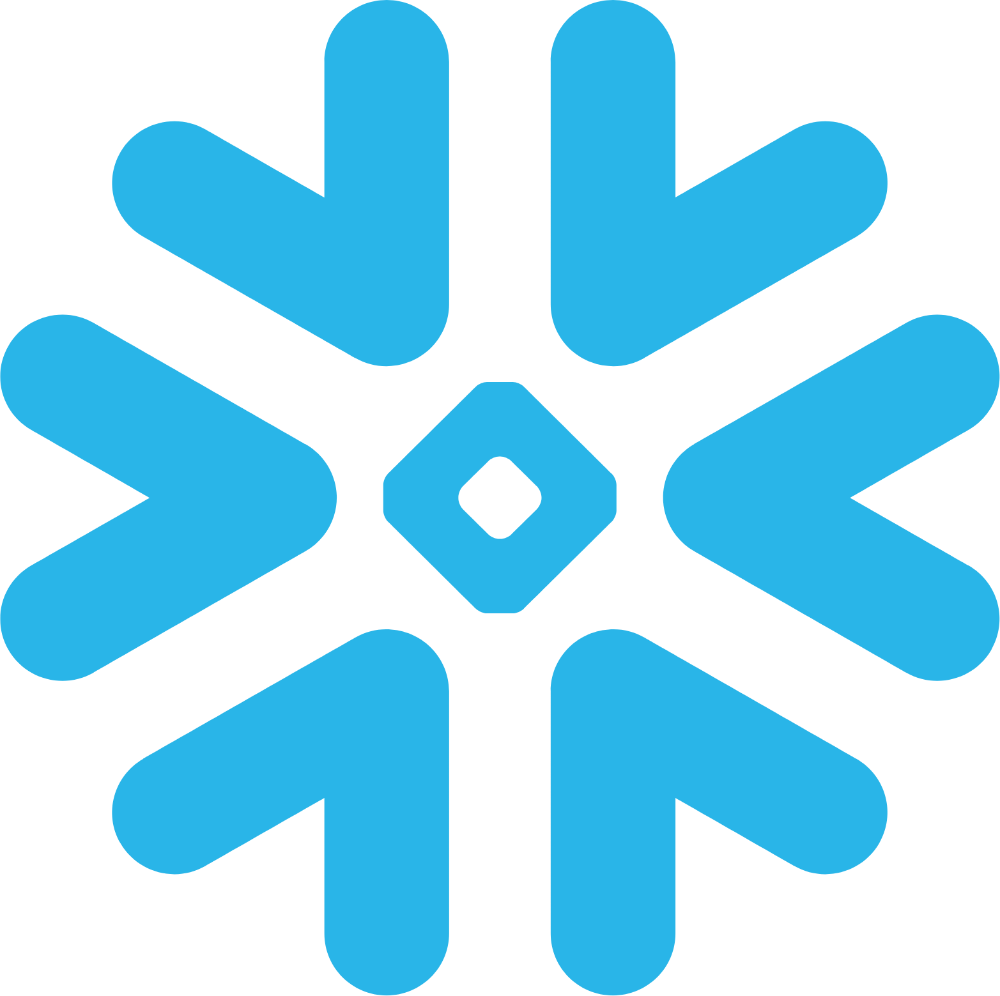

In [643]:
df.describe()

## Identifying Numerical and Categorical Columns¶

In [644]:
numaric_column = df.select_dtypes(include = 'number').columns
categorical_column = df.select_dtypes(include = 'object').columns
print(numaric_column)
print("-------------------------------------")
print(categorical_column)

Index(['id', 'scrape_id', 'host_id', 'host_response_rate', 'host_acceptance_rate', 'host_listings_count', 'host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'availability_eoy', 'number_of_reviews_ly', 'estimated_occupancy_l365d', 'estimated_revenue_l365d', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms',
       'calculated_host_list

# Visualizations

## what is the distribution of Listing Price ? 

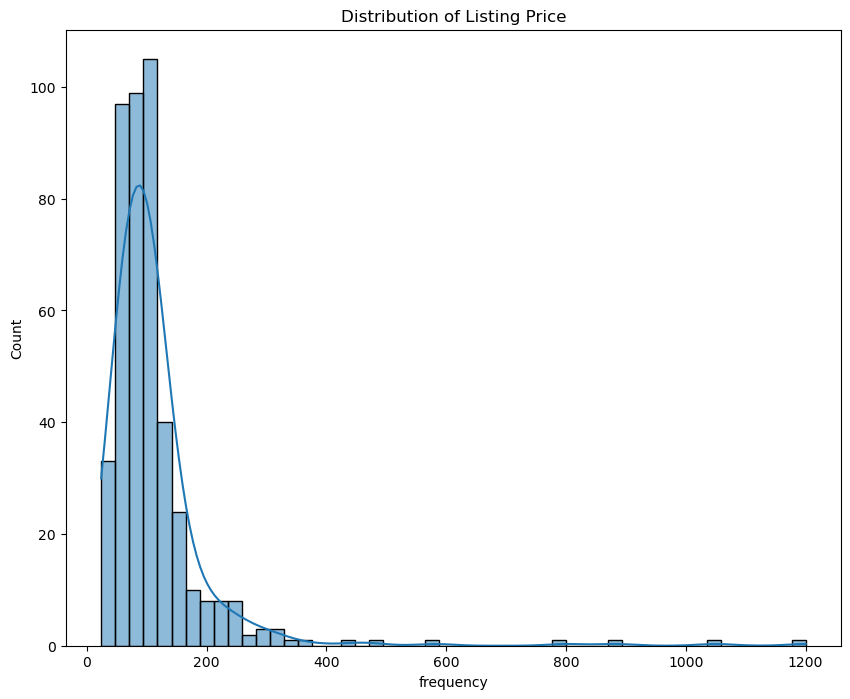

In [645]:
plt.figure(figsize = (10 , 8))
sns.histplot(df['price'] , bins = 50 , kde = True )
plt.title("Distribution of Listing Price")
plt.xlabel("Price $")
plt.xlabel("frequency")
plt.show()

## Who is the top 5  hosts ? 

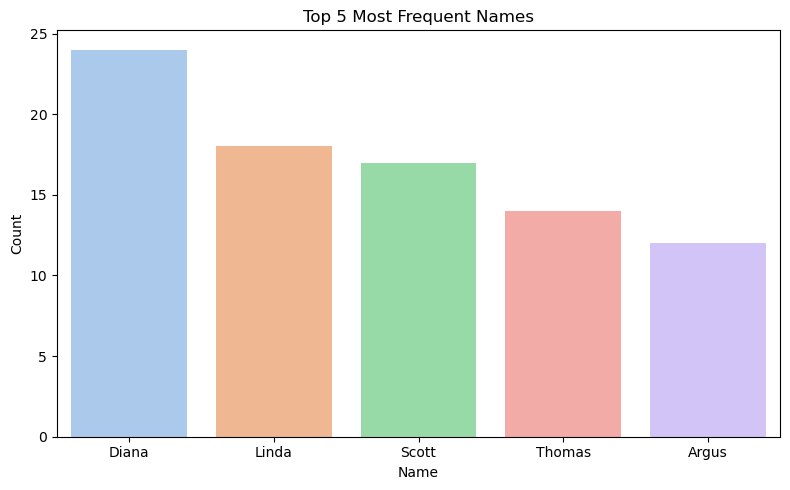

In [646]:
top_name = df['host_name'].value_counts().head(5).index
df_top5 = df[df['host_name'].isin(top_name)]

plt.figure(figsize=(8, 5))
sns.countplot(data=df_top5, x='host_name', order=top_name, palette='pastel')
plt.title('Top 5 Most Frequent Names')
plt.xlabel('Name')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

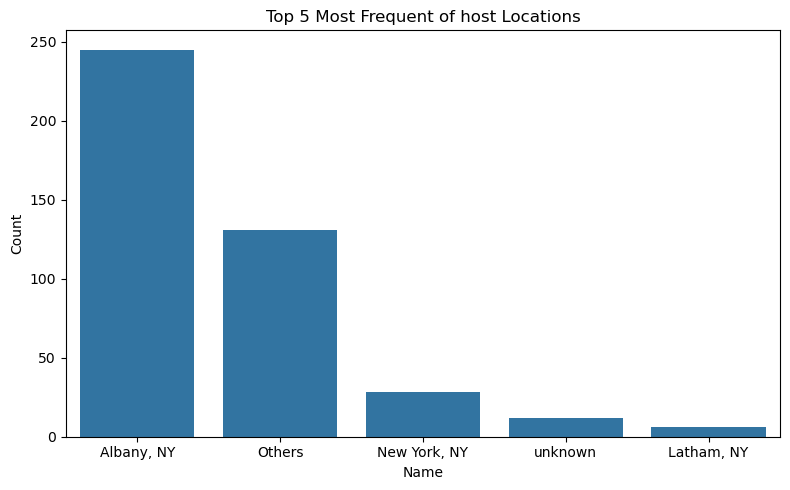

In [647]:
top_name = df['host_location'].value_counts().head(5).index
df_top5 = df[df['host_location'].isin(top_name)]

plt.figure(figsize=(8, 5))
sns.countplot(data=df_top5, x='host_location', order=top_name)
plt.title('Top 5 Most Frequent of host Locations')
plt.xlabel('Name')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

## Distribution Plots — Bedrooms, Bathrooms, Beds, Accommodates

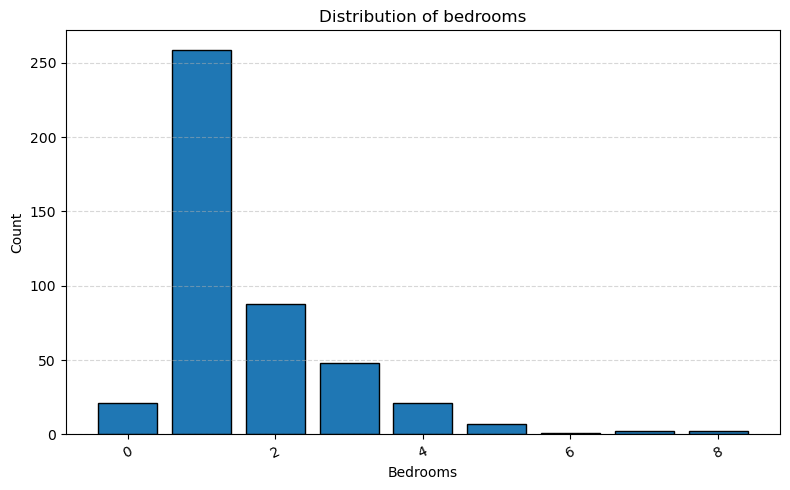

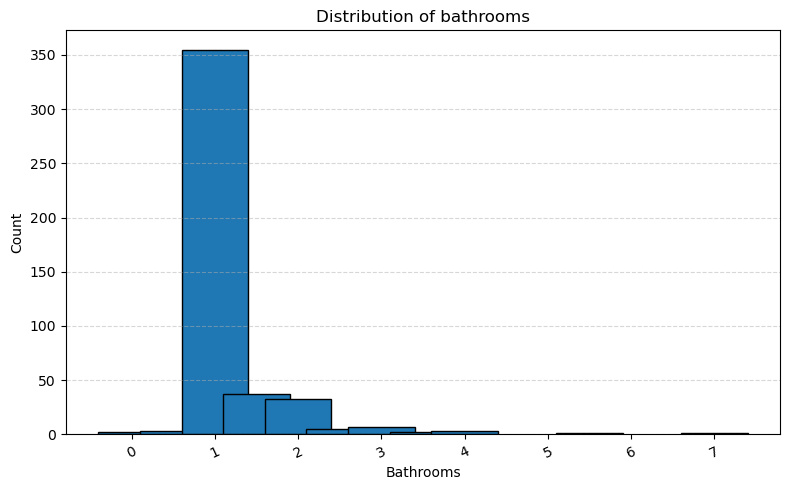

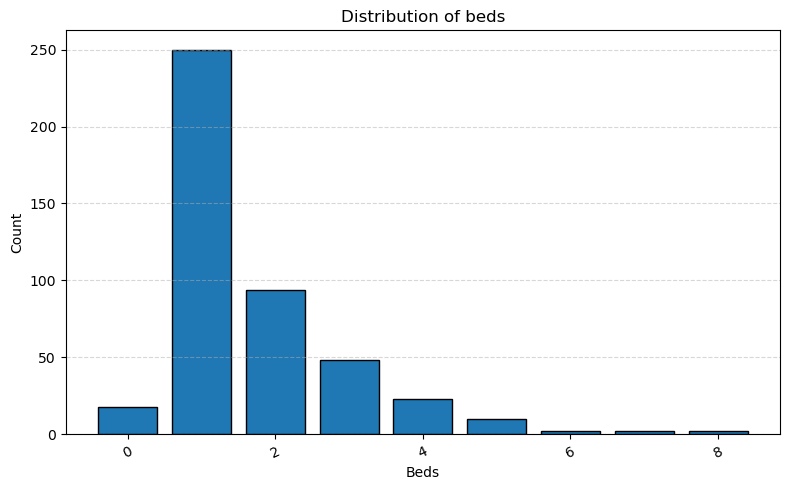

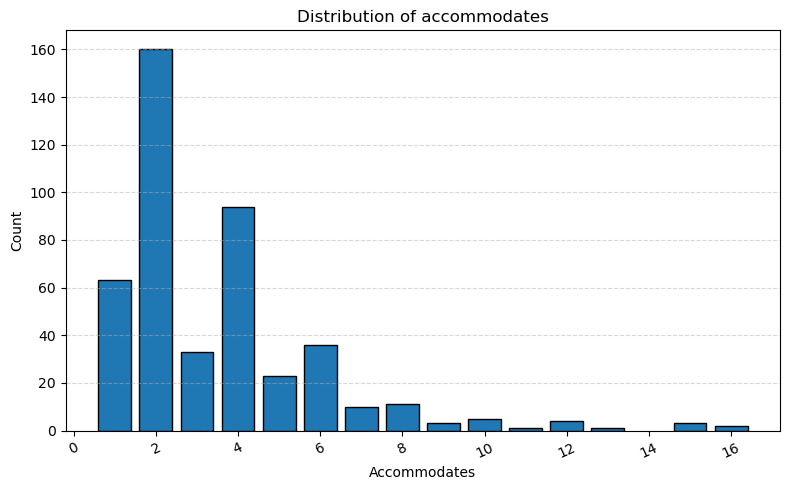

In [648]:
lis = ['bedrooms' , 'bathrooms' , 'beds' , 'accommodates']
for col in lis :
    counts = df[col].value_counts().sort_index()
    labels = counts.index
    values = counts.values
    plt.figure(figsize = (8,5))
    plt.bar(labels , values , edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col.capitalize())
    plt.ylabel('Count')
    plt.xticks(rotation=25)
    plt.tight_layout()
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()
    

## room_type Distribution

<Axes: ylabel='room_type'>

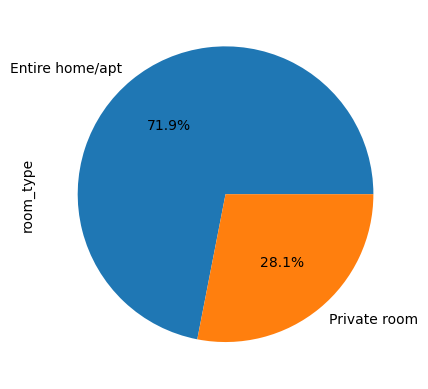

In [255]:
df['room_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')


## host_is_superhost Distribution

<Axes: ylabel='host_is_superhost'>

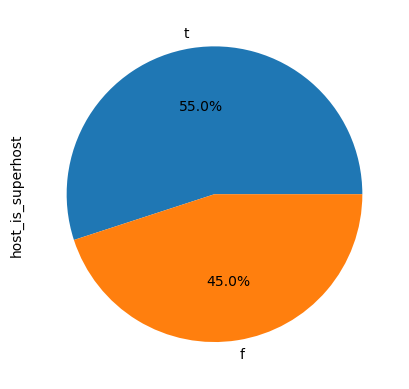

In [256]:
df['host_is_superhost'].value_counts().plot(kind='pie', autopct='%1.1f%%')

## Average Price by Room Type

<Axes: xlabel='room_type', ylabel='price'>

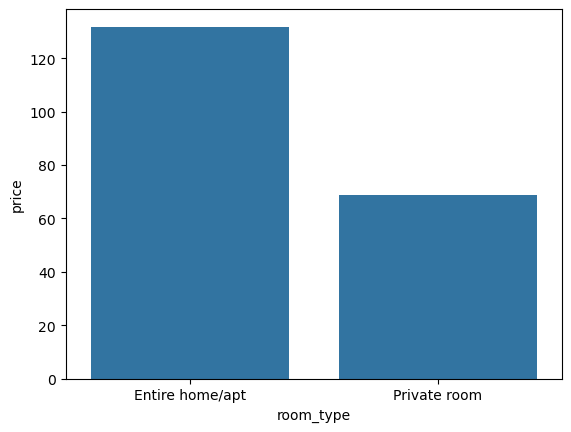

In [257]:
avg_price = df.groupby('room_type')['price'].mean().reset_index()
sns.barplot(x='room_type', y='price', data=avg_price)


## Total Estimated Revenue by Host

<Axes: xlabel='host_name'>

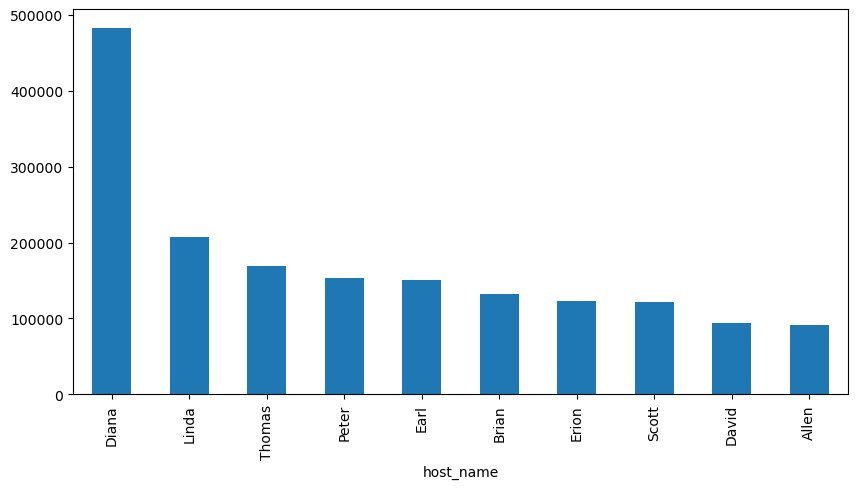

In [258]:
host_revenue = df.groupby('host_name')['estimated_revenue_l365d'].sum().sort_values(ascending=False).head(10)
host_revenue.plot(kind='bar', figsize=(10,5))


## Average Review Score by Property Type

<Axes: ylabel='property_type'>

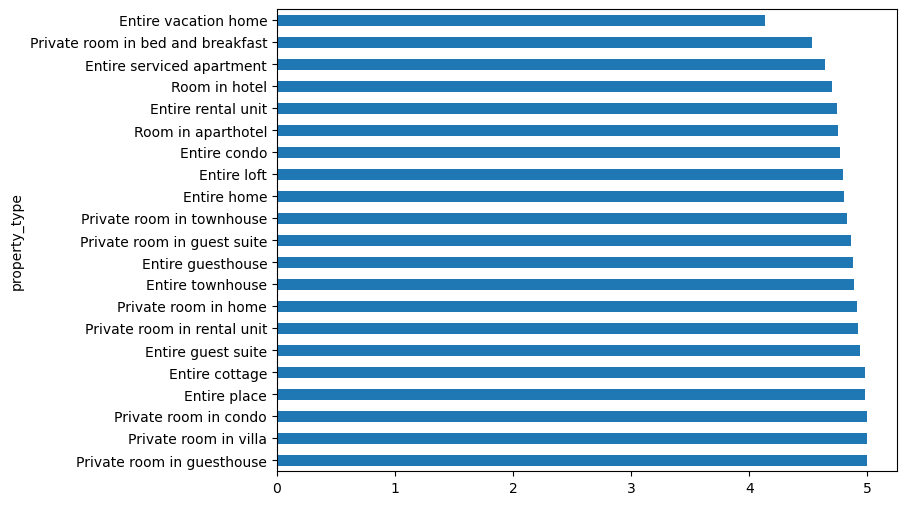

In [259]:
score_by_type = df.groupby('property_type')['review_scores_rating'].mean().sort_values(ascending=False)
score_by_type.plot(kind='barh', figsize=(8, 6))


## Number of Listings by Neighborhood cleansed 

<Axes: xlabel='neighbourhood_cleansed'>

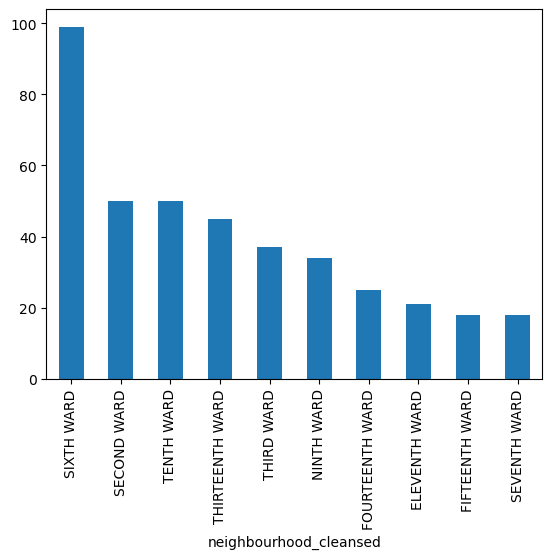

In [260]:
df.groupby('neighbourhood_cleansed')['id'].count().sort_values(ascending=False).head(10).plot(kind='bar')


##  Average & Median of Price and Rating

In [261]:
df.groupby('room_type')[['price', 'review_scores_rating']].agg(['mean', 'median'])


price        review_scores_rating       
                       mean median                 mean median
room_type                                                     
Entire home/apt  131.814609  104.0             4.757616   4.88
Private room      68.815577   54.5             4.878730   4.98

## Count by First Review Year

<Axes: xlabel='first_review_year'>

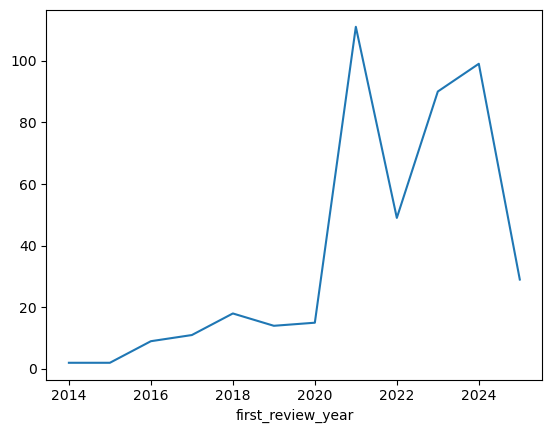

In [262]:
df.groupby('first_review_year')['id'].count().plot(kind='line')

##  Price vs. Days 

<Axes: title={'center': 'Average Price per Day'}, xlabel='Day', ylabel='Average Price'>

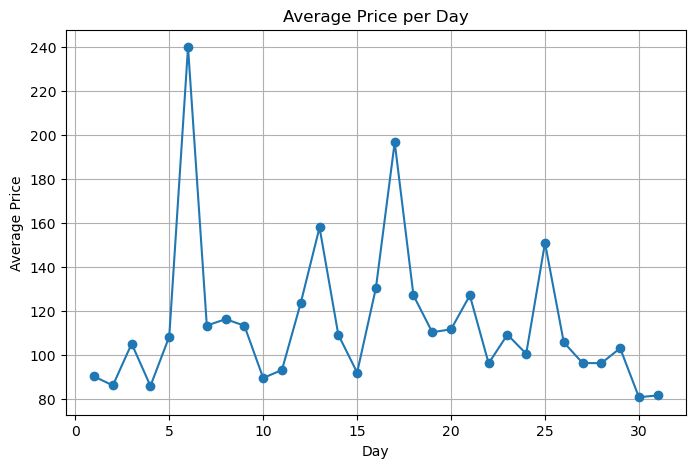

In [263]:
df.groupby('first_review_day')['price'].mean().plot(
    kind='line',
    marker='o',
    title='Average Price per Day',
    xlabel='Day',
    ylabel='Average Price',
    grid=True,
    figsize=(8, 5)
)


## Price vs. Month

<Axes: title={'center': 'Average Price per Month'}, xlabel='Month', ylabel='Average Price'>

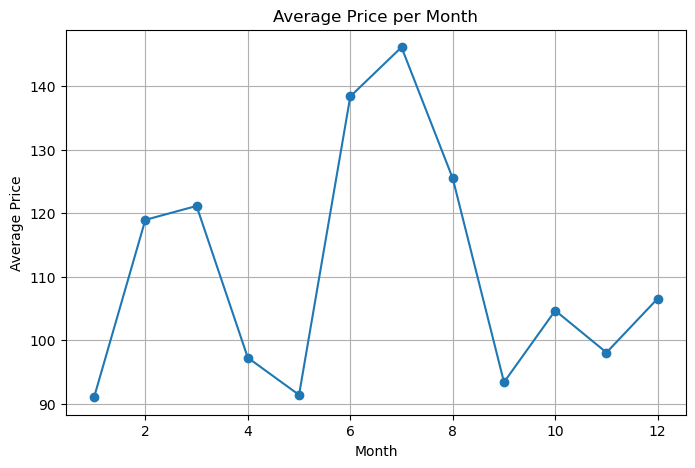

In [264]:
df.groupby('first_review_month')['price'].mean().plot(
    kind='line',
    marker='o',
    title='Average Price per Month',
    xlabel='Month',
    ylabel='Average Price',
    grid=True,
    figsize=(8, 5)
)

## Price vs. Years

<Axes: title={'center': 'Average Price per year'}, xlabel='year', ylabel='Average Price'>

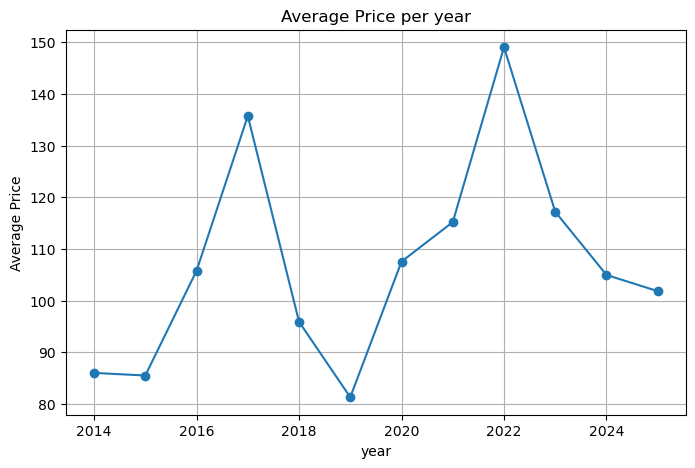

In [265]:
df.groupby('first_review_year')['price'].mean().plot(
    kind='line',
    marker='o',
    title='Average Price per year',
    xlabel='year',
    ylabel='Average Price',
    grid=True,
    figsize=(8, 5)
)

## Airbnb Listings Map — Price & Occupancy

In [266]:
fig = px.scatter_mapbox(df,
                        lat='latitude',
                        lon='longitude',
                        color='price',
                        size='estimated_occupancy_l365d',
                        hover_name='name',
                        mapbox_style='carto-positron',
                        zoom=10)
fig.show()


## Outlier Detection and Treatment 

<Axes: >

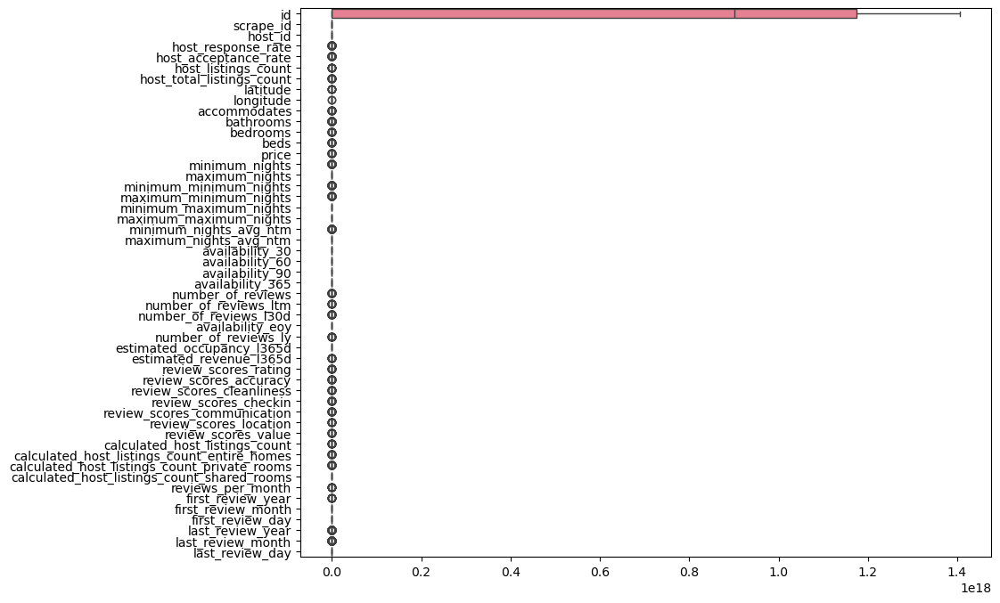

In [267]:
plt.figure(figsize =(10,8))
sns.boxplot(df[numaric_column] , orient = 'h')

## Review Scores vs. Estimated Revenue

<Axes: xlabel='review_scores_rating', ylabel='estimated_revenue_l365d'>

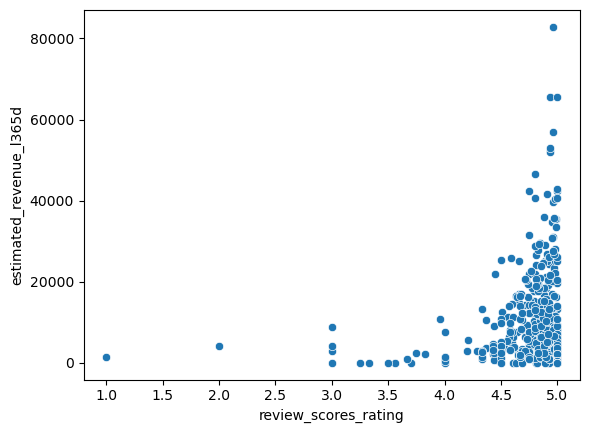

In [268]:
sns.scatterplot(x='review_scores_rating', y='estimated_revenue_l365d', data=df)


##  Checking Multicollinearity Using a Correlation Matrix

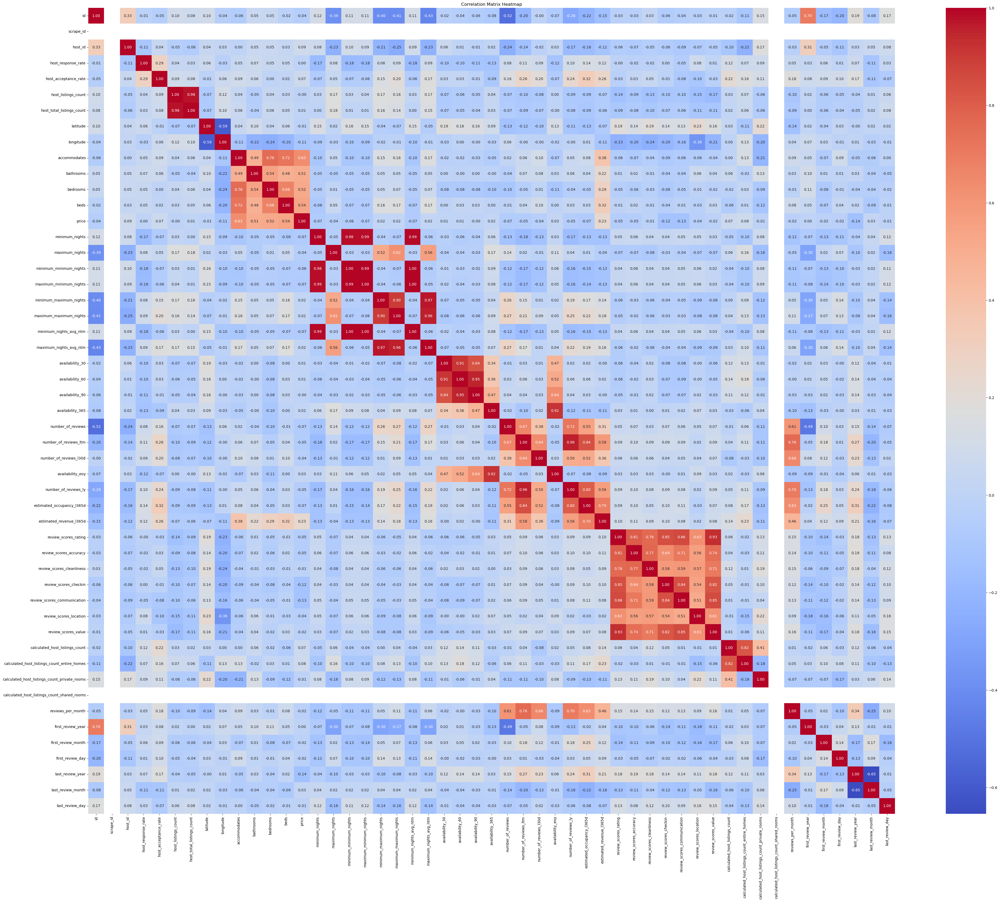

In [269]:
plt.figure(figsize=(50 , 40 ))
sns.heatmap(df[numaric_column].corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)
plt.title('Correlation Matrix Heatmap')
plt.show()

## Dropping Highly Correlated Features¶

In [270]:
# df = df.drop(columns=['id' , 'scrape_id' , 'number_of_reviews_ltm' , 'calculated_host_listings_count_shared_rooms' , 'host_total_listings_count' , 'minimum_nights'
#           , 'minimum_nights_avg_ntm' , 'minimum_maximum_nights' , 'availability_30' , 'availability_60' , 'availability_90' , 'availability_365' , 'number_of_reviews_ltm' ,
#           'number_of_reviews_ly' , 'review_scores_rating' , 'review_scores_checkin' ,'review_scores_communication' , 'calculated_host_listings_count_entire_homes'  , 'maximum_minimum_nights' , 'maximum_maximum_nights'  ] 
#  )

## Updated Correlation Matrix After Dropping Highly Correlated Features

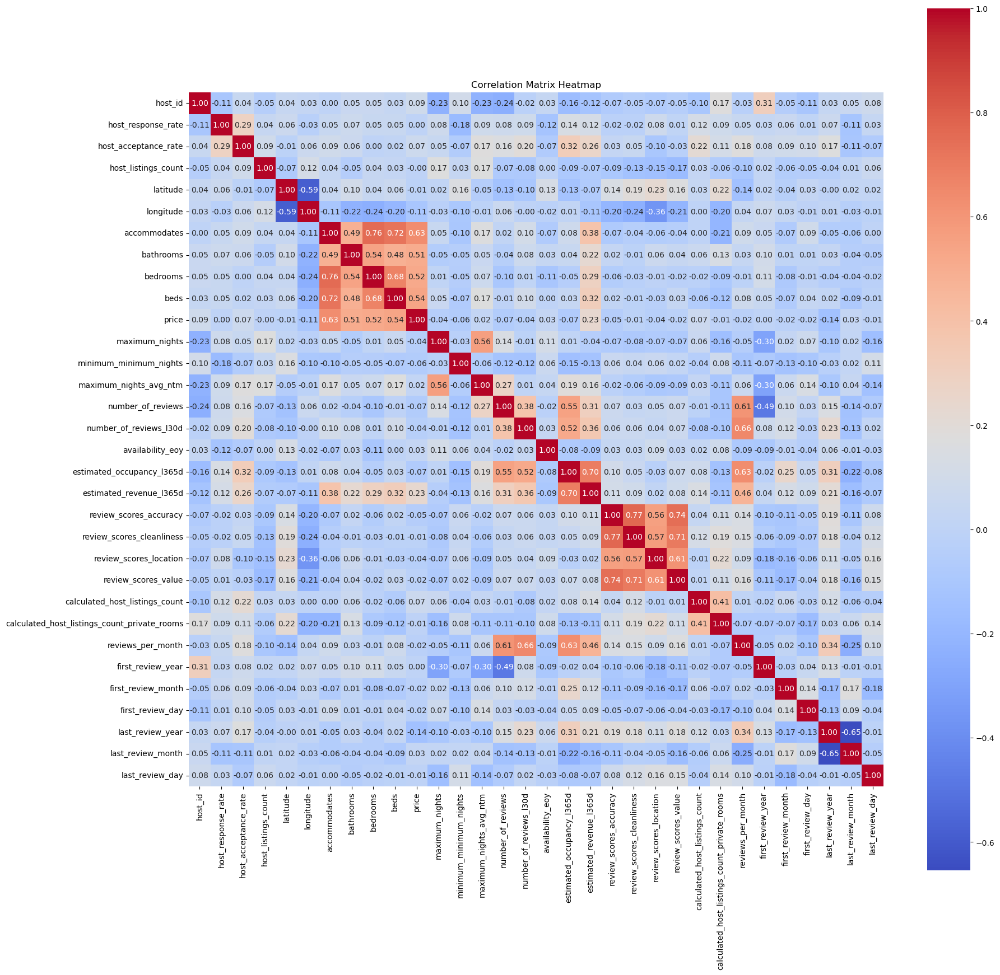

In [271]:
# numaric = df.select_dtypes(include = 'number').columns
# plt.figure(figsize=(20 , 20 ))
# sns.heatmap(df[numaric].corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)
# plt.title('Correlation Matrix Heatmap')
# plt.show()

In [649]:
corr_matrix = df.select_dtypes(include = ['float64' , 'int64']).corr()

print(corr_matrix['price'].sort_values(ascending= False))

price                                           1.000000
accommodates                                    0.634145
beds                                            0.537855
bedrooms                                        0.520431
bathrooms                                       0.505092
estimated_revenue_l365d                         0.234234
host_id                                         0.085856
calculated_host_listings_count_entire_homes     0.077154
host_acceptance_rate                            0.070064
calculated_host_listings_count                  0.068451
last_review_month                               0.030728
availability_eoy                                0.027112
maximum_nights_avg_ntm                          0.022773
availability_365                                0.020820
maximum_maximum_nights                          0.020604
minimum_maximum_nights                          0.017852
availability_60                                 0.010584
availability_30                

In [650]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
X = df[['accommodates', 'bedrooms', 'bathrooms', 'beds']]
def compute_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data.sort_values(by="VIF", ascending=False)

vif_result = compute_vif(X)
print(vif_result)

        Feature       VIF
0  accommodates  8.600395
1      bedrooms  8.107960
3          beds  6.828260
2     bathrooms  4.766220


In [651]:
X_reduced = X.drop(columns=['accommodates' , 'beds' ] , axis=1)
vif_result = compute_vif(X_reduced)
print(vif_result)

     Feature       VIF
0   bedrooms  4.084441
1  bathrooms  4.084441


In [ ]:
columns = ['bathrooms' , 'bedrooms']

plt.figure(figsize =(10,8))
sns.boxplot(df[columns] , orient = 'h')

In [652]:
df['bathrooms'] = df['bathrooms'].clip(lower= 1.0 , upper= 4.0)
df['bedrooms'] = df['bedrooms'].clip(lower= 1.0 , upper= 4.0)



##   Feature Selection for Modeling Without Handel outliers 

In [653]:
features = ['bathrooms', 'bedrooms']
X = df[features]
y = df['price']

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [654]:
X = df[selected_features]
y = df['price']

In [655]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [656]:
def kfolds(model , model_name) :
    model = cross_val_score(model , X, y , cv = 10)
    model_score = np.average(model)
    print(f"{model_name} score on cross validation: {model_score * 100}%")

def train(model , model_name) :
    model.fit(X_train, y_train)
    model_train_score = model.score(X_train, y_train)
    model_test_score = model.score(X_test, y_test)
    print(f"{model_name} model score on Training data: {model_train_score * 100}%\n{model_name} model score on Testing data: {model_test_score * 100}%")


def r2(model, model_name):
    y_pred = model.predict(X_test)
    score = r2_score(y_test,y_pred)
    print(f"R2 Score for {model_name} is {score * 100}%")

##  Linear Regression Model

In [657]:
lr = LinearRegression()
kfolds(lr ,"Linear Regression")
train(lr ,"Linear Regression")
r2(lr, "Linear Regression")

Linear Regression score on cross validation: 30.05501922502226%
Linear Regression model score on Training data: 30.652247353106777%
Linear Regression model score on Testing data: 51.688453569434635%
R2 Score for Linear Regression is 51.688453569434635%


## Random Forest Model

In [596]:
rf_model = RandomForestRegressor()
kfolds(rf_model, "Random Forest")
train(rf_model, "Random Forest")
r2(rf_model, "Random Forest")

Random Forest score on cross validation: 41.14312949204448%
Random Forest model score on Training data: 58.695234119855996%
Random Forest model score on Testing data: 63.56377578780612%
R2 Score for Random Forest is 63.56377578780612%


## KNN model

In [597]:
knn = KNeighborsRegressor()
kfolds(knn, "KNN")
train(knn, "KNN")
r2(knn, "KNN")

KNN score on cross validation: -7.1980049548364695%
KNN model score on Training data: 34.15937896228709%
KNN model score on Testing data: 50.95287084965374%
R2 Score for KNN is 50.95287084965374%


## SVR model

In [600]:
svr_model = SVR()

kfolds(svr_model ,"Linear Regression")
train(svr_model ,"Linear Regression")
r2(svr_model, "Linear Regression")

Linear Regression score on cross validation: -2.223004294194626%
Linear Regression model score on Training data: 4.186695853163059%
Linear Regression model score on Testing data: 21.00277043306876%
R2 Score for Linear Regression is 21.00277043306876%


## Bagging Model

In [602]:
br = BaggingRegressor(n_estimators=200, random_state=42)
kfolds(br, "Bagging")
train(br, "Bagging")
r2(br, "Bagging")

Bagging score on cross validation: 40.4147449369707%
Bagging model score on Training data: 59.6575705262702%
Bagging model score on Testing data: 61.11484048375976%
R2 Score for Bagging is 61.11484048375976%


## Gradient Boosting Model

In [603]:
gbr = GradientBoostingRegressor()
kfolds(gbr, "Gradient Boosting")
train(gbr, "Gradient Boosting")
r2(gbr, "Gradient Boosting")

Gradient Boosting score on cross validation: 22.073337570086533%
Gradient Boosting model score on Training data: 63.042906775317995%
Gradient Boosting model score on Testing data: 63.173196838029774%
R2 Score for Gradient Boosting is 63.173196838029774%


## ---------------------------------------------------------------------

# handel Features  withe clip outlier 

In [658]:
df['bedrooms'].value_counts()

1.0    280
2.0     88
3.0     48
4.0     33
Name: bedrooms, dtype: int64

In [662]:
def clip_outliers_iqr(df):
    clipped_df = df.copy()
    
    for col in clipped_df.columns:
        Q1 = clipped_df[col].quantile(0.25)
        Q3 = clipped_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        clipped_df[col] = clipped_df[col].clip(lower=lower_bound, upper=upper_bound)

    return clipped_df


In [663]:
new_df = df[['bathrooms' , 'bedrooms' , 'price']]

In [665]:
clean_df = clip_outliers_iqr(new_df)


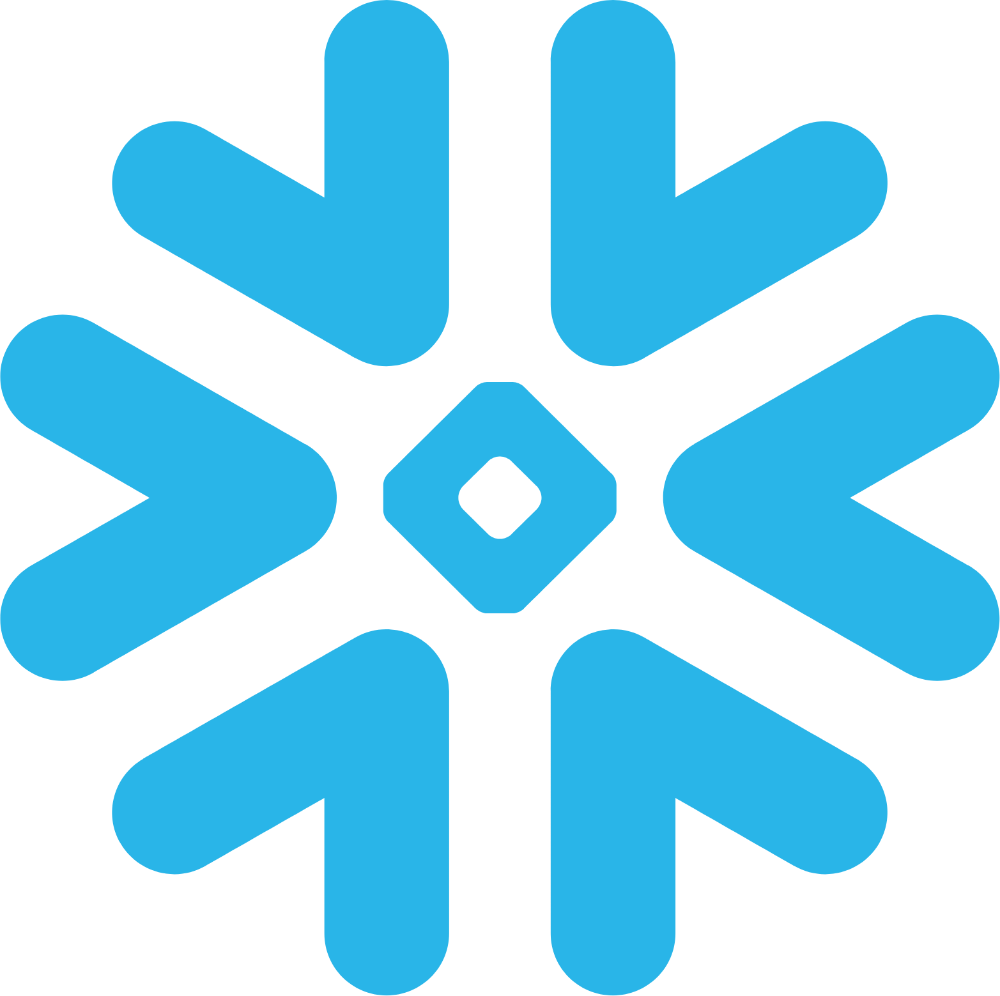

In [666]:
clean_df

In [667]:
df['bedrooms'].value_counts()

1.0    280
2.0     88
3.0     48
4.0     33
Name: bedrooms, dtype: int64


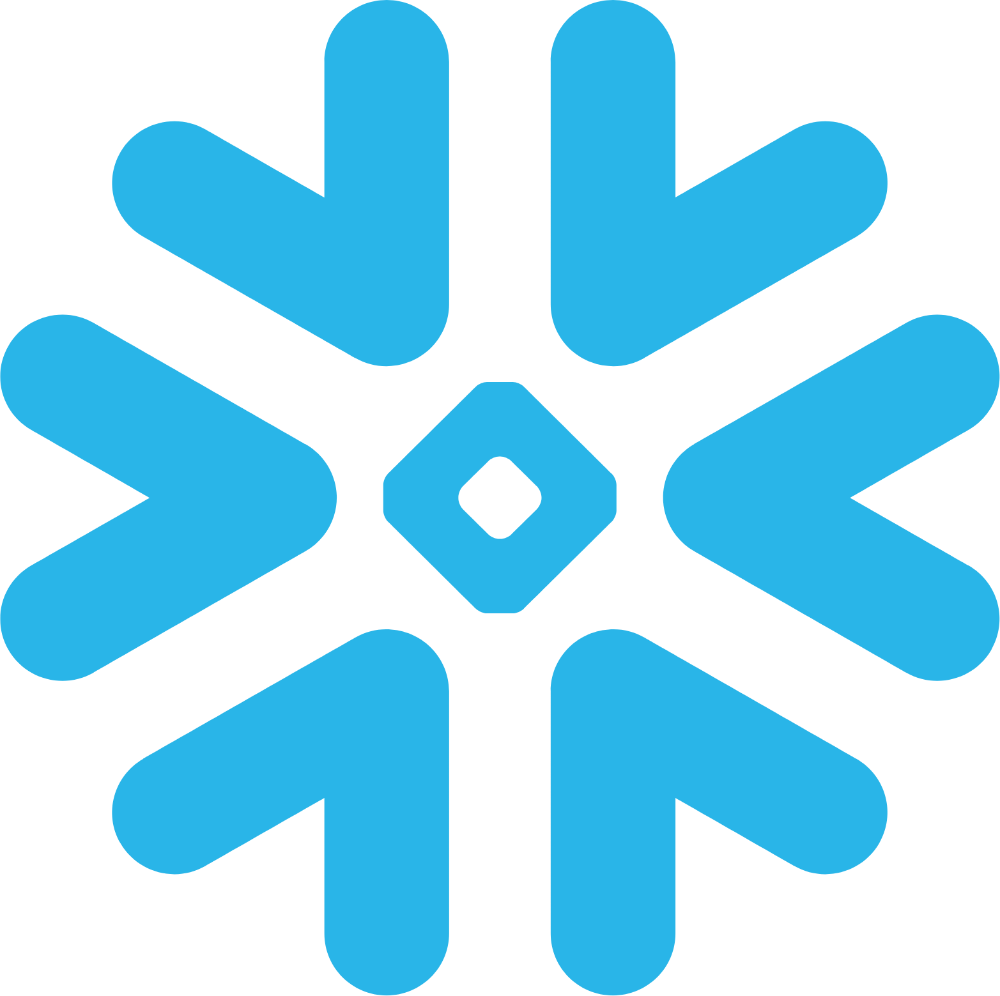

In [668]:
new_df.head()

In [669]:
features = ['bathrooms', 'bedrooms']
X = clean_df[features]
y = clean_df['price']


In [670]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [671]:
lr = LinearRegression()
kfolds(lr ,"Linear Regression")
train(lr ,"Linear Regression")
r2(lr, "Linear Regression")

Linear Regression score on cross validation: 37.646910514231436%
Linear Regression model score on Training data: 42.40838315478672%
Linear Regression model score on Testing data: 43.87756466986029%
R2 Score for Linear Regression is 43.87756466986029%


## ----------------------------------

## remove_outliers

In [537]:
new_df2 = df[['bathrooms' , 'bedrooms' , 'price']]

In [672]:
def remove_outliers_iqr(df):

    filtered_df = df.copy()

    for col in filtered_df.columns:
        Q1 = filtered_df[col].quantile(0.25)
        Q3 = filtered_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Keep only rows within the IQR bounds for this column
        filtered_df = filtered_df[
            (filtered_df[col] >= lower_bound) & (filtered_df[col] <= upper_bound)
        ]

    return filtered_df


In [673]:
clipped_df = remove_outliers_iqr(new_df2)

In [674]:
features = ['bathrooms', 'bedrooms']
X = clipped_df[features]
y = clipped_df['price']


In [675]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Linear regression 

In [676]:
lr = LinearRegression()
kfolds(lr ,"Linear Regression")
train(lr ,"Linear Regression")
r2(lr, "Linear Regression")

Linear Regression score on cross validation: 0.4879476795584592%
Linear Regression model score on Training data: 22.70611412347474%
Linear Regression model score on Testing data: 15.558901556358872%
R2 Score for Linear Regression is 15.558901556358872%


## SVR model

In [677]:
model = SVR()

kfolds(model ,"Linear Regression")
train(model ,"Linear Regression")
r2(model, "Linear Regression")

Linear Regression score on cross validation: -2.5427571517418857%
Linear Regression model score on Training data: 19.753124363869745%
Linear Regression model score on Testing data: 17.61833930809036%
R2 Score for Linear Regression is 17.61833930809036%


<Axes: >

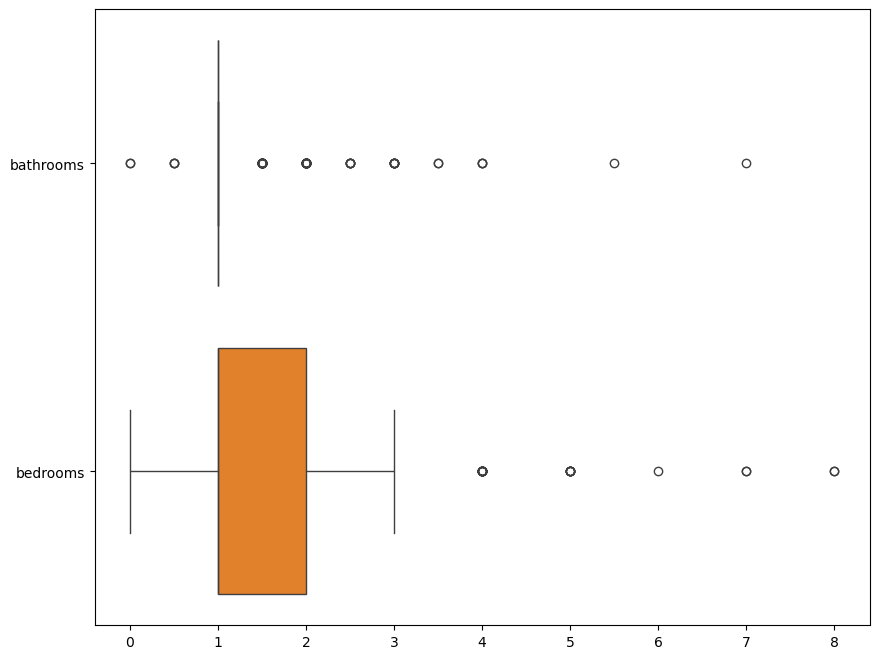

## Try to resist outliuer with BINssssssssssss

In [678]:
df['bathrooms_bin'] = pd.cut(df['bathrooms'] , bins= [0,1,2,3,4,10] , labels = ['0-1', '1-2', '2-3', '3-4', '4+'] )  

In [679]:
df['bedrooms_bin'] = pd.cut(df['bedrooms'] , bins= [0,1,2,3,4,10] , labels = ['0-1', '1-2', '2-3', '3-4', '4+'] ) 

In [680]:
features = ['bathrooms_bin' , 'bedrooms_bin']
df_encoded= pd.get_dummies(df[features])


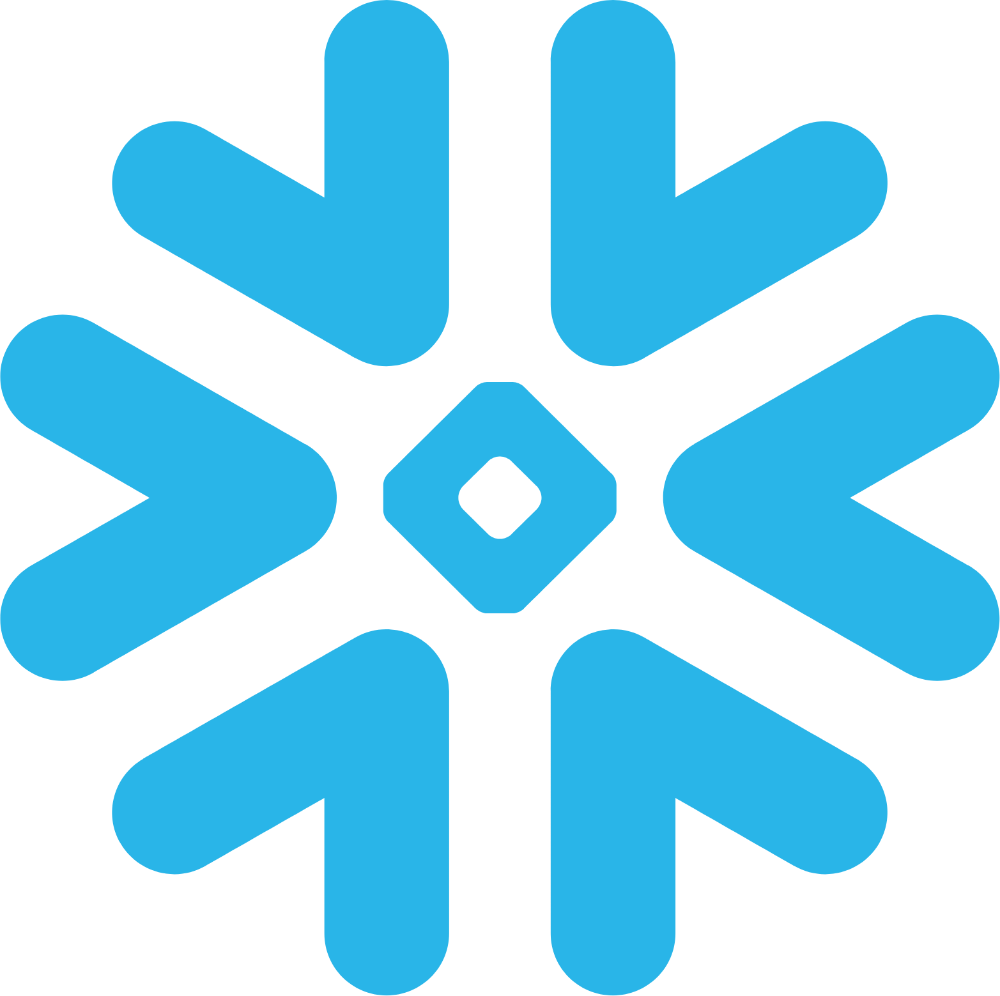

In [681]:
df_encoded

In [685]:
df['bathrooms_bin'].value_counts()

0-1    360
1-2     70
2-3     12
3-4      7
4+       0
Name: bathrooms_bin, dtype: int64

In [605]:
df['bathrooms'].value_counts()

1.0    355
1.5     37
2.0     33
3.0      7
2.5      5
0.5      3
4.0      3
3.5      2
0.0      2
5.5      1
7.0      1
Name: bathrooms, dtype: int64


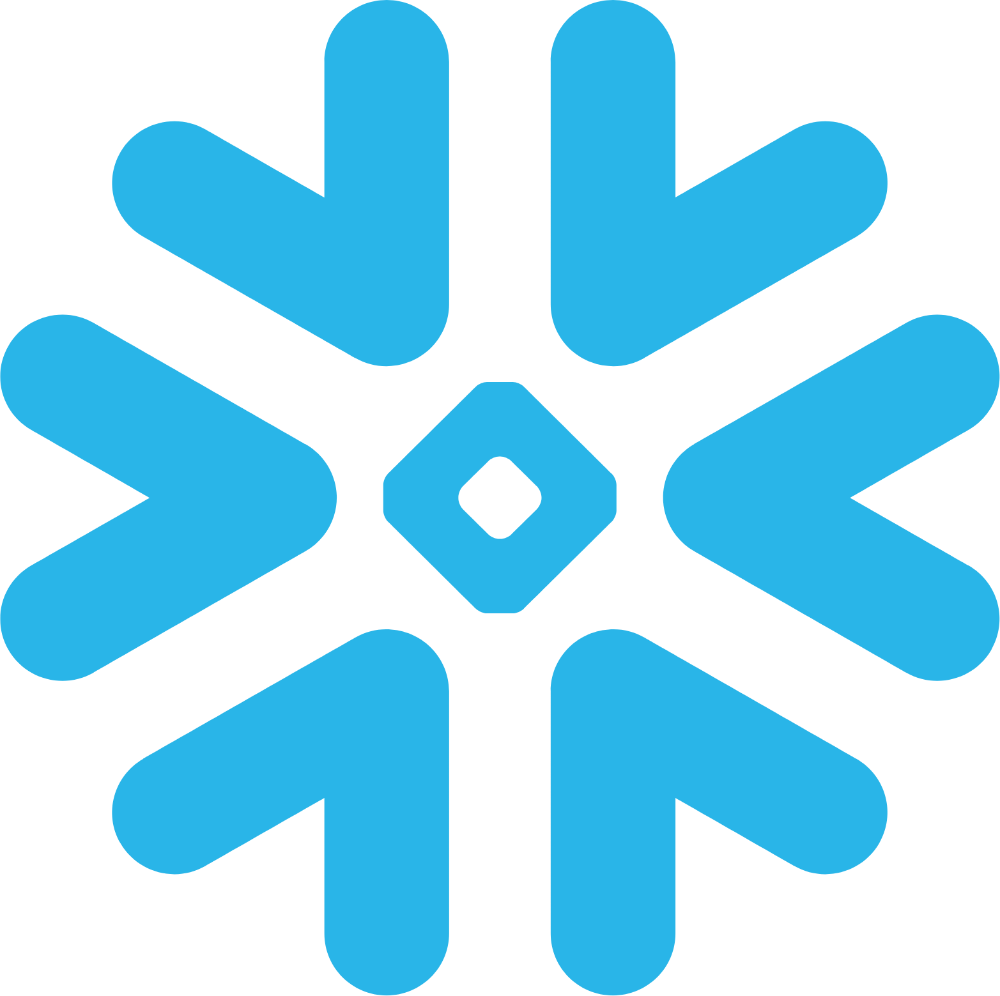

In [682]:
X = df_encoded

y = df['price']
X

In [683]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [684]:
lr = LinearRegression()
kfolds(lr ,"Linear Regression")
train(lr ,"Linear Regression")
r2(lr, "Linear Regression")

Linear Regression score on cross validation: -5.350308469520218%
Linear Regression model score on Training data: 42.03841358336335%
Linear Regression model score on Testing data: 52.51235559077504%
R2 Score for Linear Regression is 52.51235559077504%


In [686]:
rf_model = RandomForestRegressor()
kfolds(rf_model, "Random Forest")
train(rf_model, "Random Forest")
r2(rf_model, "Random Forest")

Random Forest score on cross validation: -7.092141720663428%
Random Forest model score on Training data: 47.28886258759899%
Random Forest model score on Testing data: 50.71247401304324%
R2 Score for Random Forest is 50.71247401304324%


In [687]:

knn = KNeighborsRegressor()
kfolds(knn, "KNN")
train(knn, "KNN")
r2(knn, "KNN")

KNN score on cross validation: 6.610679118153853%
KNN model score on Training data: 45.66351051382366%
KNN model score on Testing data: 51.35552631773188%
R2 Score for KNN is 51.35552631773188%
